In [35]:
import pandas as pd
import numpy as np
from tqdm import tqdm

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

from scipy.signal import butter,filtfilt
import h5py

In [36]:
def read_mat_file(path, label):
    with h5py.File(path, 'r') as f:
        # from D to Q 14 columns
        keys = [k for k in f['#refs#'].keys() if 'd' <= k <= 'q']
        data_arrays = [np.array(f['#refs#/' + k]).ravel() for k in keys]
        data = np.vstack(data_arrays).T

        # the name of each column
        names = []
        for ref in f['#refs#/v']:
            obj = f[ref[0]]
            s = obj[:].tobytes().decode('utf-16', errors='ignore').strip('\x00')
            names.append(s)

    df = pd.DataFrame(data, columns=names)
    df["label"] = label
    print(f"{label} loaded, shape = {df.shape}")
    return df

In [ ]:
F0L = read_mat_file("../../data/GPVS-Faults/F0L.mat", "F0L")
F1L = read_mat_file("../../data/GPVS-Faults/F1L.mat", "F1L")
F2L = read_mat_file("../../data/GPVS-Faults/F2L.mat", "F2L")
F3L = read_mat_file("../../data/GPVS-Faults/F3L.mat", "F3L")
F4L = read_mat_file("../../data/GPVS-Faults/F4L.mat", "F4L")
F5L = read_mat_file("../../data/GPVS-Faults/F5L.mat", "F5L")
F6L = read_mat_file("../../data/GPVS-Faults/F6L.mat", "F6L")
F7L = read_mat_file("../../data/GPVS-Faults/F7L.mat", "F7L")
F0M = read_mat_file("../../data/GPVS-Faults/F0M.mat", "F0M")
F1M = read_mat_file("../../data/GPVS-Faults/F1M.mat", "F1M")
F2M = read_mat_file("../../data/GPVS-Faults/F2M.mat", "F2M")
F3M = read_mat_file("../../data/GPVS-aFaults/F3M.mat", "F3M")
F4M = read_mat_file("../../data/GPVS-Faults/F4M.mat", "F4M")
F5M = read_mat_file("../../data/GPVS-Faults/F5M.mat", "F5M")
F6M = read_mat_file("../../data/GPVS-Faults/F6M.mat", "F6M")
F7M = read_mat_file("../../data/GPVS-Faults/F7M.mat", "F7M")
print(F0L.head())

F0L loaded, shape = (143715, 15)
F1L loaded, shape = (129013, 15)
F2L loaded, shape = (142128, 15)
F3L loaded, shape = (103497, 15)
F4L loaded, shape = (144014, 15)
F5L loaded, shape = (143015, 15)
F6L loaded, shape = (144015, 15)
F7L loaded, shape = (144015, 15)
F0M loaded, shape = (141014, 15)
F1M loaded, shape = (139014, 15)
F2M loaded, shape = (144015, 15)
F3M loaded, shape = (69967, 15)
F4M loaded, shape = (144014, 15)
F5M loaded, shape = (144014, 15)
F6M loaded, shape = (144015, 15)
F7M loaded, shape = (144015, 15)
       Time       Ipv         Vpv         Vdc        ia        ib        ic  \
0  0.000028  1.572327  101.348877  144.140625 -0.135133  0.490112 -0.354985   
1  0.000128  1.503265  101.458740  143.554688 -0.108277  0.510254 -0.388555   
2  0.000228  1.492859  101.574707  143.554688 -0.168702  0.496826 -0.334844   
3  0.000328  1.558136  101.312256  143.261719 -0.135133  0.510254 -0.361699   
4  0.000428  1.631927  101.141357  143.847656 -0.202271  0.503540 -0.321416   

# RobustScaler

Purpose: Feature scaling that is insensitive to outliers

Formula: X_scaled = (X - median(X)) / IQR(X), where IQR(X) = Q3(X) - Q1(X)

In [53]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import RobustScaler

def detect_iforest(
    df,
    features=None,
    contamination=0.01,
    n_estimators=300,
    random_state=42,
    standardize=True
):
    # 1) drop 'label'
    if features is None:
        X = df.select_dtypes(include=[np.number]).copy()
        if 'label' in X.columns:
            X = X.drop(columns=['label'])
    else:
        X = df[features].copy()
    
    # 2) RobustScaler Nromalization
    if standardize:
        scaler = RobustScaler()
        X_scaled = scaler.fit_transform(X)
    else:
        scaler = None
        X_scaled = X.values

    # 3) train iForest
    clf = IsolationForest(
        n_estimators=n_estimators,
        contamination=contamination,
        random_state=random_state,
        n_jobs=-1
    )
    clf.fit(X_scaled)
    scores = clf.decision_function(X_scaled)
    preds = clf.predict(X_scaled)

    # 4) rewrite to DataFrame
    out = df.copy()
    out['iforest_score'] = scores
    out['is_anomaly'] = (preds == -1).astype(int)

    return out, clf, scaler

# Isolation Forest (iForest)

Multivariate outlier detection method - IForest depends more on distribution than density/distance

-> which may cause the disappearance of the sinusoidal peak (have to check if this brings a dataset distortion or overprocessing)

### Key Idea
- Anomalies are few and different.

- Randomly partitioning data isolates anomalous points in fewer splits → shorter path lengths in random trees.

### Algorithm

1. **Randomly select** a feature `j` and a split value  `s ∈ [min(x_j), max(x_j)]`.

2. **Partition** the data into two subsets

3. **Recurse** until one of the following conditions is met:
   - The node contains **a single sample**
   - A **maximum tree height** is reached  
   - All samples at the node have **identical feature values**.

4. **Repeat** steps 1–3 to build an **ensemble of isolation trees (iTrees)**.


In [54]:
datasets = {
    'F0L': F0L, 'F1L': F1L, 'F2L': F2L, 'F3L': F3L,
    'F4L': F4L, 'F5L': F5L, 'F6L': F6L, 'F7L': F7L,
}

features = ['Ipv', 'Vpv', 'Vdc', 'ia', 'ib', 'ic', 'va', 'vb', 'vc', 'Iabc', 'If', 'Vabc', 'Vf']

results = {}
summary_rows = []

for name, df in datasets.items():
    df_out, clf, scaler = detect_iforest(
        df,
        features=features,
        contamination='auto',   # outlier percentage
        n_estimators=300, # number of trees, meaning the number of combinations of features
        random_state=42,
        standardize=True
    )
    results[name] = df_out
    
    n = len(df_out)
    n_anom = int(df_out['is_anomaly'].sum())
    ratio = n_anom / n if n > 0 else 0.0
    summary_rows.append({'dataset': name, 'rows': n, 'anomalies': n_anom, 'ratio': ratio})

summary = pd.DataFrame(summary_rows).sort_values('dataset')
print(summary)


  dataset    rows  anomalies     ratio
0     F0L  143715      11014  0.076638
1     F1L  129013       7384  0.057235
2     F2L  142128      21232  0.149386
3     F3L  103497      15303  0.147859
4     F4L  144014       9756  0.067743
5     F5L  143015      17873  0.124973
6     F6L  144015      11577  0.080387
7     F7L  144015      10778  0.074839


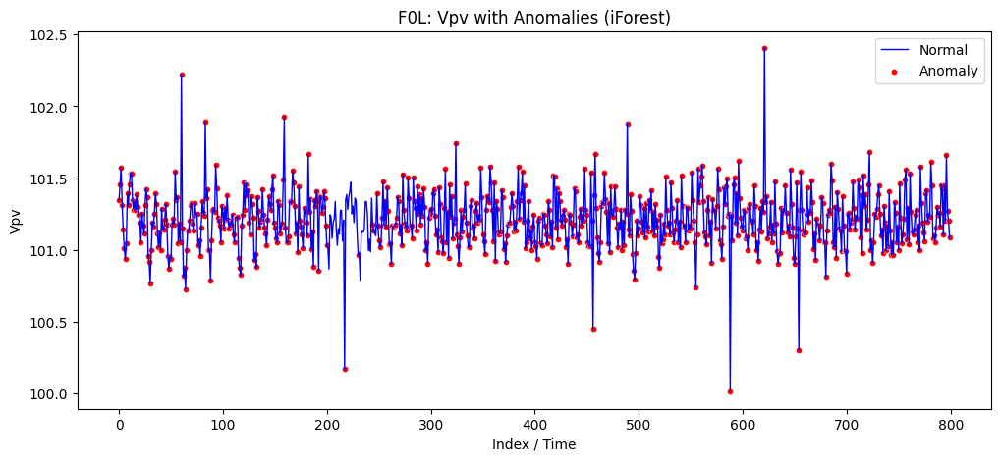

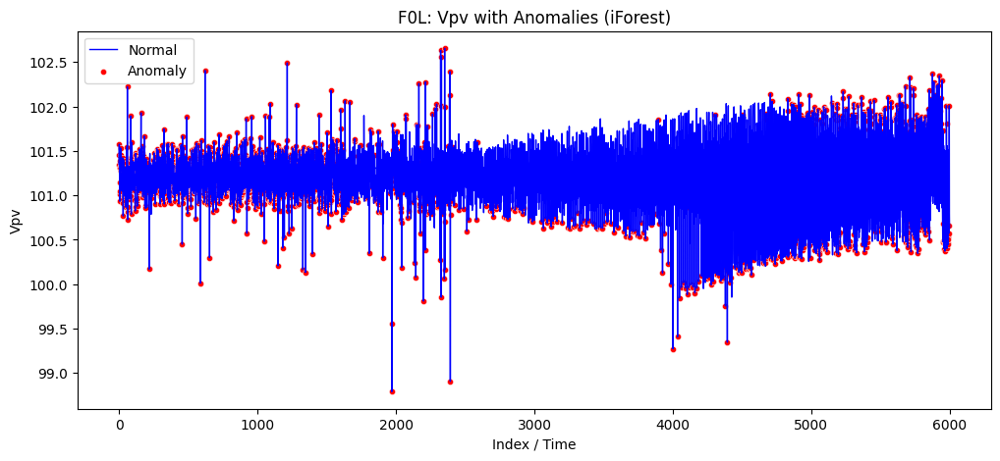

In [100]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_timeseries_anomalies(df, feature='Vpv', title='F0L'):
    plt.figure(figsize=(12,5))
    sns.lineplot(x=df.index, y=df[feature], label='Normal', color='blue', linewidth=1)
    sns.scatterplot(
        x=df.index[df['is_anomaly']==1],
        y=df[feature][df['is_anomaly']==1],
        color='red', s=20, label='Anomaly'
    )
    plt.title(f"{title}: {feature} with Anomalies (iForest)")
    plt.xlabel("Index / Time")
    plt.ylabel(feature)
    plt.legend()
    plt.show()
    
F0L_iforest_auto, _, _ = detect_iforest(F0L, contamination='auto') 
plot_timeseries_anomalies(F0L_iforest_auto[0:800], feature='Vpv', title='F0L')
plot_timeseries_anomalies(F0L_iforest_auto[0:6000], feature='Vpv', title='F0L')

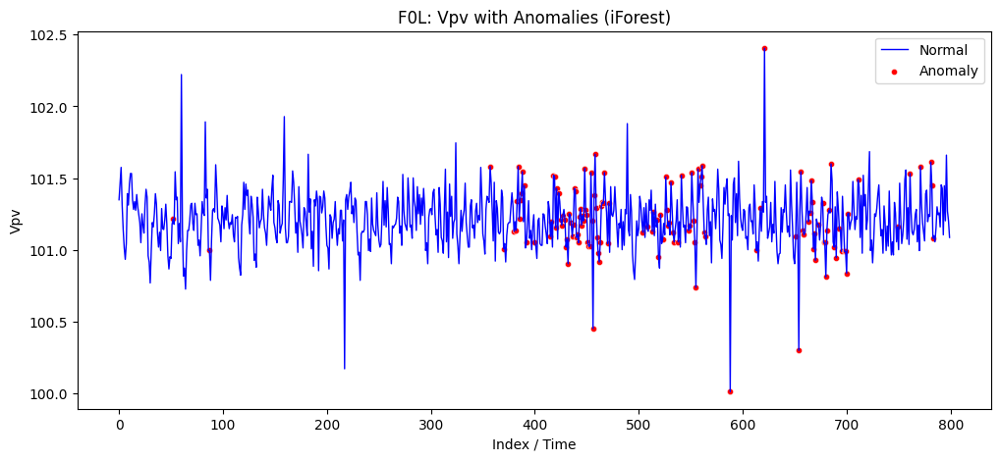

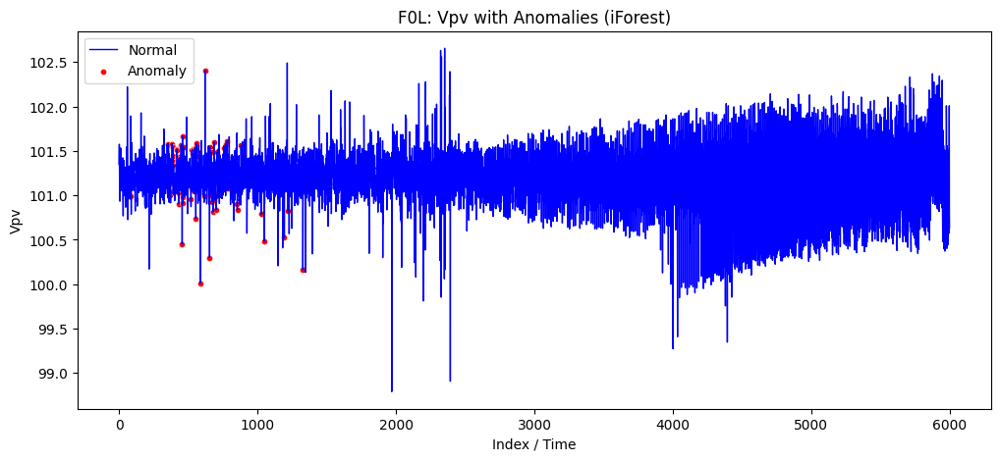

In [101]:
F0L_iforest, _, _ = detect_iforest(F0L, contamination=0.001) 
plot_timeseries_anomalies(F0L_iforest[0:800], feature='Vpv', title='F0L')
plot_timeseries_anomalies(F0L_iforest[0:6000], feature='Vpv', title='F0L')

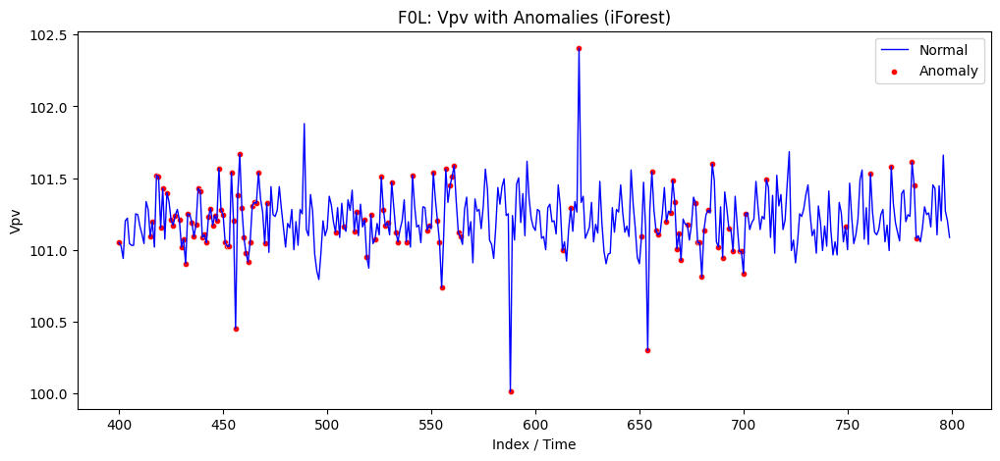

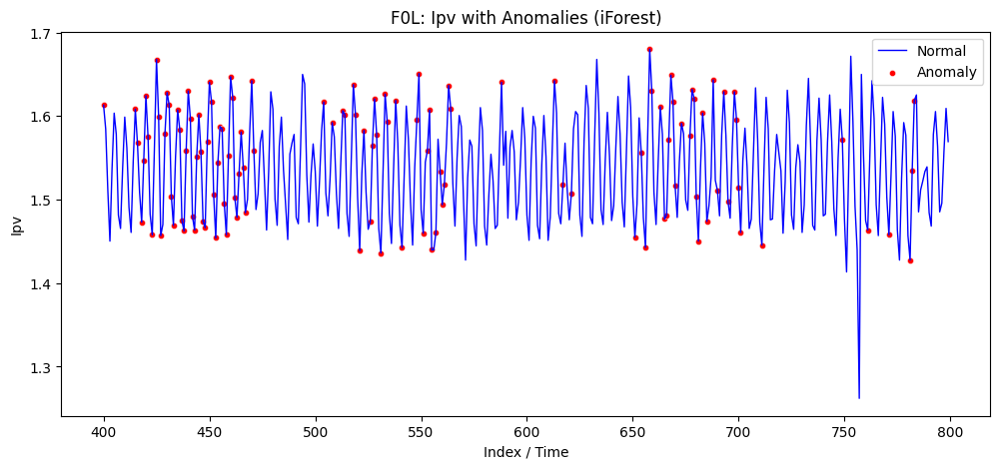

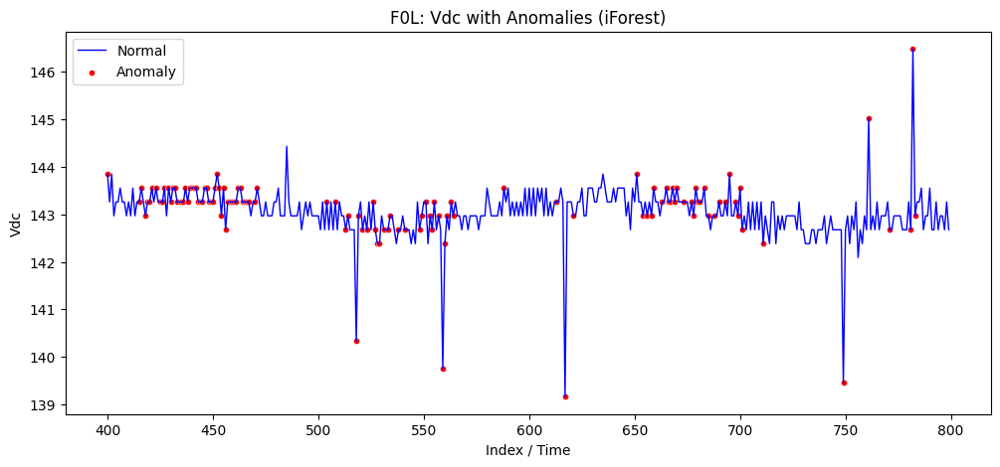

In [102]:
plot_timeseries_anomalies(F0L_iforest[400:800], feature='Vpv', title='F0L')
plot_timeseries_anomalies(F0L_iforest[400:800], feature='Ipv', title='F0L')
plot_timeseries_anomalies(F0L_iforest[400:800], feature='Vdc', title='F0L')

1.0


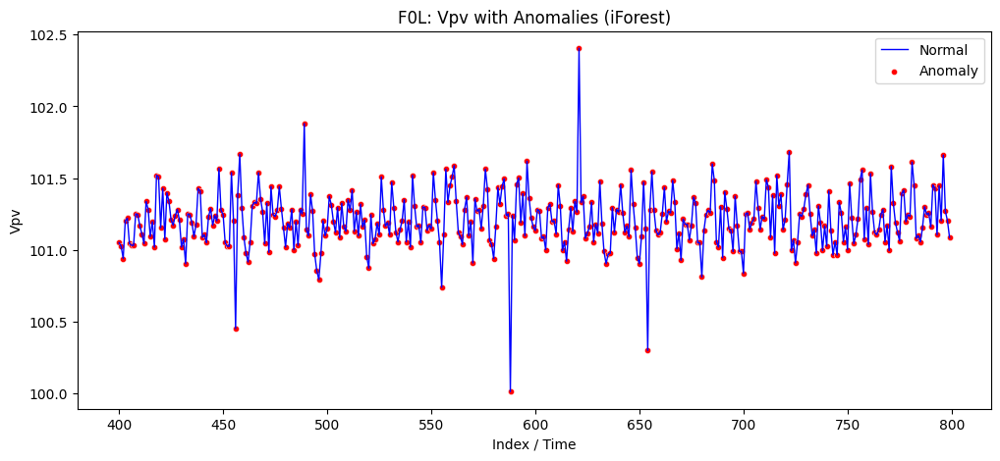

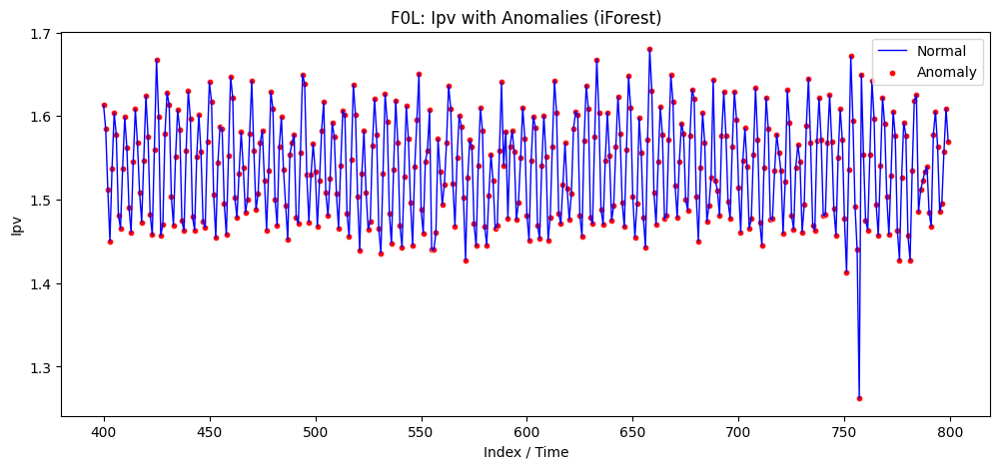

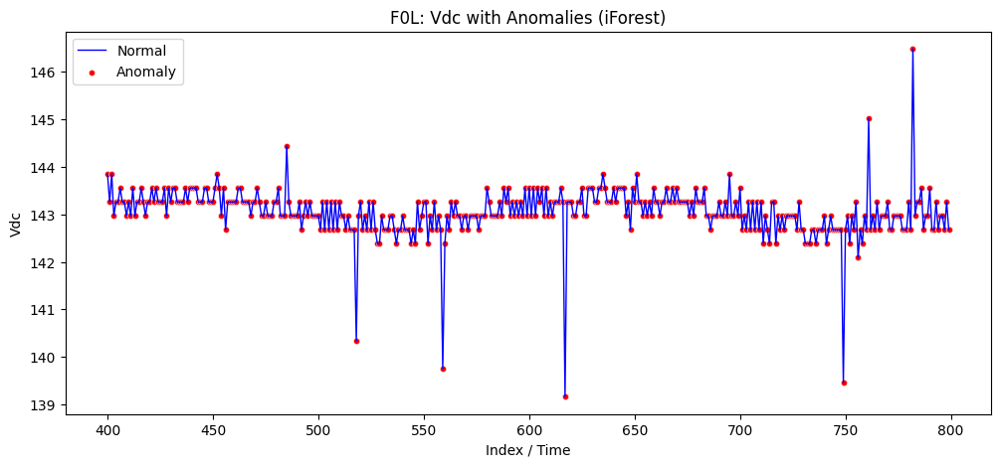

In [108]:
ratio_400 = F0L_iforest_auto.loc[400:800, 'is_anomaly'].mean()
print(ratio_400)
plot_timeseries_anomalies(F0L_iforest_auto[400:800], feature='Vpv', title='F0L')
plot_timeseries_anomalies(F0L_iforest_auto[400:800], feature='Ipv', title='F0L')
plot_timeseries_anomalies(F0L_iforest_auto[400:800], feature='Vdc', title='F0L')

In [113]:
""" 'plotly visualization' not finished yet !!! """




from scipy.signal import savgol_filter, find_peaks
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
import pandas as pd

def plot_timeseries_anomalies_interactive(
    df: pd.DataFrame,
    feature: str = 'Vpv',
    title: str = 'F0L',
    anomaly_col: str = 'is_anomaly',
    show_savgol: bool = True,
    savgol_window: int = 31,
    savgol_polyorder: int = 2,
    show_peaks: bool = False,
    peak_prominence: float | None = None,
    peak_distance: int | None = None,
):

    if feature not in df.columns:
        raise ValueError(f"Column {feature} not found in df.")

    x = df.index
    y = df[feature].astype(float).to_numpy()

    y_smooth = None
    if show_savgol and len(y) >= max(savgol_window, 3):
        if savgol_window % 2 == 0:
            savgol_window += 1
        savgol_window = min(savgol_window, len(y) - (1 - len(y) % 2))
        if savgol_window < 3:
            show_savgol = False
        else:
            y_smooth = savgol_filter(
                y,
                window_length=savgol_window,
                polyorder=min(savgol_polyorder, savgol_window - 1)
            )

    peak_idx = np.array([], dtype=int)
    if show_peaks:
        kwargs = {}
        if peak_prominence is not None:
            kwargs['prominence'] = peak_prominence
        if peak_distance is not None:
            kwargs['distance'] = peak_distance
        peak_idx, _ = find_peaks(y if y_smooth is None else y_smooth, **kwargs)

    if anomaly_col in df.columns:
        anomaly_mask = (df[anomaly_col].fillna(0).astype(int) == 1).to_numpy()
    else:
        anomaly_mask = np.zeros_like(y, dtype=bool)

    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=x, y=y,
        mode='lines',
        name=f'{feature}',
        hovertemplate='Time: %{x}<br>'+f'{feature}: '+'%{y}<extra></extra>'
    ))

    if show_savgol and y_smooth is not None:
        fig.add_trace(go.Scatter(
            x=x, y=y_smooth,
            mode='lines',
            name=f'{feature} (Savgol)',
            line=dict(dash='dash'),
            hovertemplate='Time: %{x}<br>'+f'{feature} (smooth): '+'%{y}<extra></extra>'
        ))

    if anomaly_mask.any():
        fig.add_trace(go.Scatter(
            x=x[anomaly_mask],
            y=y[anomaly_mask],
            mode='markers',
            name='Anomaly',
            marker=dict(size=7, symbol='x'),
            hovertemplate='Time: %{x}<br>'+f'{feature}: '+'%{y}<br>Type: Anomaly<extra></extra>'
        ))

    if show_peaks and peak_idx.size > 0:
        fig.add_trace(go.Scatter(
            x=x[peak_idx],
            y=(y_smooth if y_smooth is not None else y)[peak_idx],
            mode='markers',
            name='Peaks (scipy.signal)',
            marker=dict(size=8),
            hovertemplate='Time: %{x}<br>'+f'{feature} (ref): '+'%{y}<br>Type: Peak<extra></extra>'
        ))

    fig.update_layout(
        title=f"{title}: {feature} with Anomalies (iForest + Plotly)",
        xaxis_title="Index / Time",
        yaxis_title=feature,
        hovermode='x unified',
        margin=dict(l=40, r=20, t=60, b=40),
    )
    fig.update_xaxes(rangeslider=dict(visible=True), showspikes=True)
    fig.update_yaxes(showspikes=True)

    fig.show()
    return fig


F0L_iforest, _, _ = detect_iforest(
    df,
    features=features,
    contamination=0.001,
    n_estimators=1000,
    random_state=42,
    standardize=True
)

plot_timeseries_anomalies_interactive(
    F0L_iforest,
    feature='Vpv',
    title='F0L',
    show_savgol=True,
    savgol_window=31,
    savgol_polyorder=2,
    show_peaks=False
)
